# 🤖 **Model Benchmark — Bitcoin (BTC)**

### 🎯 **Objective**  
Evaluate and compare multiple machine learning models to predict **bearish reversals (crashes)** in Bitcoin.

### ⚠️ **Problem Definition**  
Binary classification task:

- `1` → Crash (>10% drop within 7 days)  
- `0` → No crash  

The dataset is **highly imbalanced** (~2% crashes), making this a **rare event prediction problem** in a **time series context**.

### 🔬 **Benchmark Focus**

1. **Baseline comparison**  
   - DummyClassifier (majority class)  
   - Logistic Regression (with class_weight)

2. **Model comparison (adapted to tabular time series + imbalance)**  
   - **Tree-based models (robust reference models)**
     - Random Forest (class_weight="balanced")
  
   - **Boosting methods (state-of-the-art on tabular data)**
     - XGBoost (scale_pos_weight)  
     - LightGBM (is_unbalance / scale_pos_weight)  
     - CatBoost (handles imbalance well, less tuning)
  
   - **Linear models (reference)**
     - Logistic Regression (regularized)

3. **Handling class imbalance**  
   - Class weights (balanced / scale_pos_weight)  
   - Threshold tuning (important for recall)  

4. **Evaluation metrics (critical)**  
   - Recall (detect crashes)  
   - Precision (avoid false alarms)  
   - F1-score  
   - **PR-AUC (main metric for rare events)**  

5. **Model ranking**  
   - Compare models based on PR-AUC and Recall  
   - Analyze trade-off Precision vs Recall  

### 🧪 **Benchmark Methodology**

The benchmark is conducted using a **time-aware cross-validation strategy** to ensure realistic evaluation and avoid data leakage.

- The dataset is first split into **Train / Test** using chronological order  
- All model comparisons are performed **exclusively on the Train set**  
- A **TimeSeriesSplit (cross-validation)** is applied:
  - Models are trained on past data and validated on future data  
  - This process is repeated across multiple folds  
- For each model:
  - Training and prediction are performed on each fold  
  - Metrics (PR-AUC, F1, Recall) are computed per fold  
  - Final performance is obtained by **averaging across folds**  

This approach provides a **robust and realistic estimate** of model performance under temporal constraints.

### 🧠 **Rationale for Model Selection**

The selected models are chosen to cover a spectrum of complexity and performance levels, while being well-suited for **tabular financial data and imbalanced classification**:

- **DummyClassifier**  
  Provides a minimal baseline to verify that models outperform trivial predictions  

- **Logistic Regression**  
  A simple and interpretable linear model that serves as a strong baseline for detecting linear relationships  

- **Random Forest**  
  A robust ensemble model that captures non-linear patterns and interactions with minimal tuning  

- **Boosting methods (XGBoost, LightGBM, CatBoost)**  
  State-of-the-art models for tabular data:
  - Handle non-linearities and feature interactions effectively  
  - Perform well on imbalanced datasets via weighting mechanisms  
  - Often achieve the best performance in structured data problems  

These models allow assessing:
- Whether simple signals exist (linear models)  
- Whether more complex patterns improve prediction (tree/boosting models)  
- The overall **predictability of crash events** in the dataset  

### 📏 **Rationale for Evaluation Metrics**

Standard metrics such as accuracy are **not suitable** in this context due to strong class imbalance (~2% crashes). A model predicting only the majority class would achieve high accuracy while being useless.

The selected metrics focus on the ability to detect rare but critical events:

- **Recall**  
  Measures the proportion of actual crashes correctly detected.  
  This is crucial as missing a crash is more costly than raising a false alarm.

- **Precision**  
  Measures how many predicted crashes are actually correct.  
  Important to avoid excessive false positives in practical usage.

- **F1-score**  
  Harmonic mean of Precision and Recall.  
  Provides a balanced view when both false positives and false negatives matter.

- **PR-AUC (Precision-Recall AUC)**  
  The most relevant metric for rare event detection:
  - Focuses on the minority class (crashes)  
  - Captures model performance across all classification thresholds  
  - More informative than ROC-AUC in highly imbalanced settings  

A random or trivial model yields a PR-AUC close to the positive class proportion (~2%), making it a strong baseline reference.

### 🚀 **Goal**  
Determine whether the dataset contains **predictive signal**, and identify the **best candidate models** (likely boosting methods) for the next steps: feature engineering, hyperparameter tuning, and time-aware validation.

In [13]:
import pandas as pd
from pipelines.ml_benchmark import run_benchmark_pipeline

### **1. View and clean DF**

In [ ]:
# Load the dataset
df = pd.read_csv("../../data/gold/market/btc_usdt_1d_features.csv")
df.head()

,open_time,open,high,low,close,volume,quote_asset_volume,number_of_trades,taker_buy_base_volume,taker_buy_quote_volume,...,lag_volume_norm,lag_buy_pressure,momentum_acc,volatility_ratio,momentum_volatility,pressure_x_return,ma_7,ma_30,ma_ratio,target
0,2017-09-16,3674.01,3950.00,3470.66,3714.95,1297.563953,4.804878e+06,8809,624.887842,2.314536e+06,...,2.390714,0.490700,-0.156191,1.727747,-0.013297,0.001946,3864.460000,4239.663667,0.911502,1
1,2017-09-17,3685.23,3748.21,3499.02,3699.99,682.171210,2.466490e+06,6355,273.931976,9.948436e+05,...,1.544177,0.481585,-0.008068,1.737193,-0.010831,-0.001617,3802.977143,4226.051000,0.899889,1
2,2017-09-18,3690.00,4123.20,3690.00,4035.01,1030.006455,4.069033e+06,8220,417.638722,1.651863e+06,...,0.828846,0.401559,0.094573,1.780640,-0.004561,0.036714,3778.197143,4222.552000,0.894766,1
3,2017-09-19,4060.00,4089.97,3830.91,3910.04,902.332129,3.558315e+06,7342,257.320352,1.016804e+06,...,1.219432,0.405472,-0.121518,1.783364,-0.006777,-0.008832,3741.957143,4216.677000,0.887418,1
4,2017-09-20,3910.04,4046.08,3820.00,3900.00,720.935076,2.839584e+06,7231,395.275138,1.562210e+06,...,1.050238,0.285173,0.028404,1.752188,-0.001237,-0.001408,3735.572857,4212.810333,0.886718,0


Delete useless columns (selected based on collinearity analysis in 01_eda_btc.ipynb)

In [15]:
SELECTED_FEATURES = [
    # Momentum
    "return_1d", "return_7d",

    # Volatility
    "volatility_7d", "volatility_30d",

    # Market behavior
    "buy_pressure",

    # Risk
    "drawdown",

    # Trend
    "ma_ratio",

    # Lags
    "lag_return_1d", "lag_return_7d",
    "lag_volatility_7d",
    "lag_buy_pressure",
    "lag_volume_norm",

    # Additional
    "momentum_acc",
    "momentum_volatility",
    "volume",
    "number_of_trades",
    "quote_asset_volume"
]

TARGET = "target"

df = df[SELECTED_FEATURES + [TARGET]]
df.head()

,return_1d,return_7d,volatility_7d,volatility_30d,buy_pressure,drawdown,ma_ratio,lag_return_1d,lag_return_7d,lag_volatility_7d,lag_buy_pressure,lag_volume_norm,momentum_acc,momentum_volatility,volume,number_of_trades,quote_asset_volume,target
0,0.004041,-0.127702,0.104128,0.060268,0.481585,-0.231640,0.911502,0.160231,-0.136079,0.103904,0.490700,2.390714,-0.156191,-0.013297,1297.563953,8809,4.804878e+06,1
1,-0.004027,-0.104199,0.103943,0.059834,0.401559,-0.234734,0.899889,0.004041,-0.127702,0.104128,0.481585,1.544177,-0.008068,-0.010831,682.171210,6355,2.466490e+06,1
2,0.090546,-0.041217,0.110665,0.062149,0.405472,-0.165443,0.894766,-0.004027,-0.104199,0.103943,0.401559,0.828846,0.094573,-0.004561,1030.006455,8220,4.069033e+06,1
3,-0.030971,-0.060926,0.111239,0.062376,0.285173,-0.191290,0.887418,0.090546,-0.041217,0.110665,0.405472,1.219432,-0.121518,-0.006777,902.332129,7342,3.558315e+06,1
4,-0.002568,-0.011329,0.109144,0.062290,0.548281,-0.193367,0.886718,-0.030971,-0.060926,0.111239,0.285173,1.050238,0.028404,-0.001237,720.935076,7231,2.839584e+06,0


Handle NaN values

In [16]:
df.isna().sum()

return_1d              0
return_7d              0
volatility_7d          0
volatility_30d         0
buy_pressure           0
drawdown               0
ma_ratio               0
lag_return_1d          0
lag_return_7d          0
lag_volatility_7d      0
lag_buy_pressure       0
lag_volume_norm        0
momentum_acc           0
momentum_volatility    0
volume                 0
number_of_trades       0
quote_asset_volume     0
target                 0
dtype: int64

No NaN value in the df

Setup X,y train and test

In [17]:
X = df.drop(columns=[TARGET])
y = df[TARGET]

split_index = int(len(df) * 0.8)
X_train, X_test = X.iloc[:split_index], X.iloc[split_index:]
y_train, y_test = y.iloc[:split_index], y.iloc[split_index:]
X_train.shape

(2492, 17)

Setup

[I 2026-03-27 22:41:22,773] A new study created in memory with name: no-name-acc4a693-dc96-4b1b-a628-049c7f950497
[I 2026-03-27 22:41:22,822] Trial 0 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.
[I 2026-03-27 22:41:22,835] Trial 1 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.
[I 2026-03-27 22:41:22,873] Trial 2 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.
[I 2026-03-27 22:41:22,887] Trial 3 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.
[I 2026-03-27 22:41:22,912] Trial 4 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.
[I 2026-03-27 22:41:22,936] Trial 5 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.



MODEL: dummy


[I 2026-03-27 22:41:22,982] Trial 6 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.
[I 2026-03-27 22:41:23,031] Trial 7 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.
[I 2026-03-27 22:41:23,064] Trial 8 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.
[I 2026-03-27 22:41:23,076] Trial 9 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.
[I 2026-03-27 22:41:23,090] Trial 10 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.
[I 2026-03-27 22:41:23,107] Trial 11 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with value: 0.12192771084337349.
[I 2026-03-27 22:41:23,122] Trial 12 finished with value: 0.12192771084337349 and parameters: {}. Best is trial 0 with val


=== OPTUNA RESULTS ===
Best trial: 0
Best score (PR-AUC): 0.12192771084337349
Best params: {}

=== Best Threshold === 0.1832

=== Metrics ===
{'precision': 0.15823293172690764, 'recall': 0.7786561264822134, 'f1': 0.2630173564753004, 'TP': 197.0, 'FP': 1048.0, 'FN': 56.0, 'TN': 774.0, 'pr_auc': 0.148498499928568}

=== Global Confusion Matrix ===


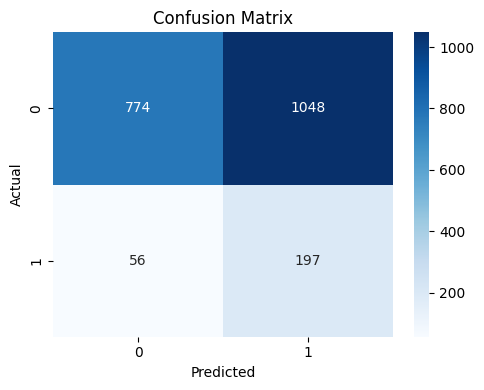

[I 2026-03-27 22:41:24,436] A new study created in memory with name: no-name-fc4f6121-4a67-48c8-b2b8-bc3bc24c2abd
/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warning


MODEL: logistic


/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linea


=== OPTUNA RESULTS ===
Best trial: 38
Best score (PR-AUC): 0.7116750720828574
Best params: {'penalty': 'l1', 'solver': 'liblinear', 'C': 26.247043037758466}


/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', and C=np.inf instead of penalty=None.
  warnings.warn(
/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1160: UserWarning: Inconsistent values: penalty=l1 with l1_ratio=0.0. penalty is deprecated. Please use l1_ratio only.
  warnings.warn(
/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1135: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use '


=== Best Threshold === 0.5000

=== Metrics ===
{'precision': 0.486784140969163, 'recall': 0.8735177865612648, 'f1': 0.6251768033946252, 'TP': 221.0, 'FP': 233.0, 'FN': 32.0, 'TN': 1589.0, 'pr_auc': 0.7039779257645281}

=== Global Confusion Matrix ===


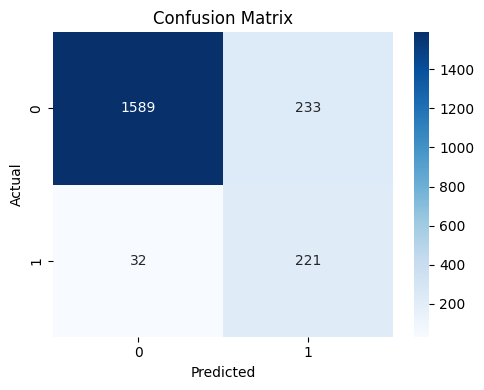

[I 2026-03-27 22:42:16,004] A new study created in memory with name: no-name-5af10e5e-6c7a-4dc8-9b91-79494ae45b06



MODEL: random_forest


[I 2026-03-27 22:42:20,804] Trial 0 finished with value: 0.7306583804625998 and parameters: {'n_estimators': 436, 'max_depth': 5, 'min_samples_leaf': 16, 'min_samples_split': 10, 'max_features': 0.5, 'bootstrap': True}. Best is trial 0 with value: 0.7306583804625998.
[I 2026-03-27 22:42:23,361] Trial 1 finished with value: 0.7283866888429906 and parameters: {'n_estimators': 260, 'max_depth': 9, 'min_samples_leaf': 17, 'min_samples_split': 17, 'max_features': 0.5, 'bootstrap': False}. Best is trial 0 with value: 0.7306583804625998.
[I 2026-03-27 22:42:30,257] Trial 2 finished with value: 0.7133316578030067 and parameters: {'n_estimators': 720, 'max_depth': 7, 'min_samples_leaf': 5, 'min_samples_split': 20, 'max_features': 0.5, 'bootstrap': False}. Best is trial 0 with value: 0.7306583804625998.
[I 2026-03-27 22:42:34,678] Trial 3 finished with value: 0.7394491662086395 and parameters: {'n_estimators': 406, 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'max_features': 


=== OPTUNA RESULTS ===
Best trial: 3
Best score (PR-AUC): 0.7394491662086395
Best params: {'n_estimators': 406, 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'max_features': 0.5, 'bootstrap': True}

=== Best Threshold === 0.4852

=== Metrics ===
{'precision': 0.6891385767790262, 'recall': 0.7272727272727273, 'f1': 0.7076923076923077, 'TP': 184.0, 'FP': 83.0, 'FN': 69.0, 'TN': 1739.0, 'pr_auc': 0.7394491662086395}

=== Global Confusion Matrix ===


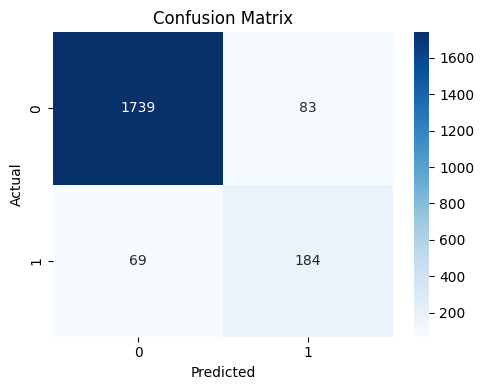

[I 2026-03-27 22:46:03,629] A new study created in memory with name: no-name-6b5d5d25-92e3-4bad-98f1-da3a51ba4d92



MODEL: xgboost


[I 2026-03-27 22:46:05,485] Trial 0 finished with value: 0.7321486313551789 and parameters: {'n_estimators': 728, 'max_depth': 9, 'learning_rate': 0.011272783814756528, 'subsample': 0.9741435080299196, 'colsample_bytree': 0.9474462440197309, 'gamma': 3.5509048813302018, 'reg_alpha': 4.604851490784047, 'reg_lambda': 4.0072447407057785}. Best is trial 0 with value: 0.7321486313551789.
[I 2026-03-27 22:46:07,299] Trial 1 finished with value: 0.7467099612743007 and parameters: {'n_estimators': 299, 'max_depth': 4, 'learning_rate': 0.027151957142741445, 'subsample': 0.78494907349171, 'colsample_bytree': 0.6513735228509221, 'gamma': 0.4036764553336769, 'reg_alpha': 3.347092025296557, 'reg_lambda': 3.9278195986007933}. Best is trial 1 with value: 0.7467099612743007.
[I 2026-03-27 22:46:08,826] Trial 2 finished with value: 0.739230339389093 and parameters: {'n_estimators': 474, 'max_depth': 8, 'learning_rate': 0.15265721942415486, 'subsample': 0.7857507472319964, 'colsample_bytree': 0.88441600


=== OPTUNA RESULTS ===
Best trial: 72
Best score (PR-AUC): 0.7592586692765975
Best params: {'n_estimators': 799, 'max_depth': 6, 'learning_rate': 0.014843637985743237, 'subsample': 0.6009114502587083, 'colsample_bytree': 0.7405150854225856, 'gamma': 1.4507666997199837, 'reg_alpha': 0.34592801658811845, 'reg_lambda': 3.3782586242242325}

=== Best Threshold === 0.3763

=== Metrics ===
{'precision': 0.7159533073929961, 'recall': 0.7272727272727273, 'f1': 0.7215686274509804, 'TP': 184.0, 'FP': 73.0, 'FN': 69.0, 'TN': 1749.0, 'pr_auc': 0.7592586692765975}

=== Global Confusion Matrix ===


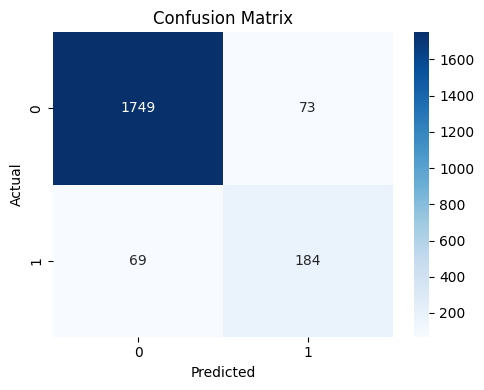

[I 2026-03-27 22:49:32,577] A new study created in memory with name: no-name-12d3a6f2-055b-4df5-b94e-1ad066f4516b



MODEL: lightgbm
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[I 2026-03-27 22:49:35,044] Trial 0 finished with value: 0.750078658344452 and parameters: {'n_estimators': 601, 'max_depth': 8, 'learning_rate': 0.05276440201510048, 'num_leaves': 95, 'subsample': 0.6531825910107677, 'colsample_bytree': 0.6270079784033001, 'reg_alpha': 3.3218054864225603, 'reg_lambda': 0.4437764402412847}. Best is trial 0 with value: 0.750078658344452.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 22:49:42,770] Trial 1 finished with value: 0.7429741309113425 and parameters: {'n_estimators': 712, 'max_depth': 8, 'learning_rate': 0.010954285859971831, 'num_leaves': 104, 'subsample': 0.9367019941352145, 'colsample_bytree': 0.9532532351228852, 'reg_alpha': 2.4414741735624643, 'reg_lambda': 2.241625172757143}. Best is trial 0 with value: 0.750078658344452.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 22:49:49,844] Trial 2 finished with value: 0.7415665932022518 and parameters: {'n_estimators': 691, 'max_depth': 6, 'learning_rate': 0.02285718262505547, 'num_leaves': 58, 'subsample': 0.6724666381919768, 'colsample_bytree': 0.7299303645750432, 'reg_alpha': 1.2403282084525942, 'reg_lambda': 1.1787405043064614}. Best is trial 0 with value: 0.750078658344452.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing c

[I 2026-03-27 22:50:04,420] Trial 3 finished with value: 0.7503223641074412 and parameters: {'n_estimators': 614, 'max_depth': 10, 'learning_rate': 0.013414450165446859, 'num_leaves': 130, 'subsample': 0.8533183683610798, 'colsample_bytree': 0.827475426575213, 'reg_alpha': 1.185751916586018, 'reg_lambda': 4.529421225515991}. Best is trial 3 with value: 0.7503223641074412.


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:50:21,873] Trial 4 finished with value: 0.7517464609486263 and parameters: {'n_estimators': 308, 'max_depth': 4, 'learning_rate': 0.019132954386340554, 'num_leaves': 103, 'subsample': 0.8798254784369455, 'colsample_bytree': 0.625097732526276, 'reg_alpha': 2.4747505019567972, 'reg_lambda': 1.2101844023274344}. Best is trial 4 with value: 0.7517464609486263.


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:50:22,774] Trial 5 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 22:50:24,047] Trial 6 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 22:50:34,629] Trial 7 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:50:36,232] Trial 8 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 22:50:50,401] Trial 9 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:50:51,965] Trial 10 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 22:50:55,877] Trial 11 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002913 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:51:00,154] Trial 12 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:51:02,504] Trial 13 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 22:51:04,949] Trial 14 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 22:51:07,686] Trial 15 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002235 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:51:11,603] Trial 16 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:51:15,222] Trial 17 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004352 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2026-03-27 22:51:19,757] Trial 18 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001983 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:51:24,264] Trial 19 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:51:26,643] Trial 20 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 22:51:28,505] Trial 21 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 22:51:30,930] Trial 22 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 22:51:32,960] Trial 23 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

[I 2026-03-27 22:51:35,535] Trial 24 pruned. 


[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[

[I 2026-03-27 22:51:37,642] Trial 25 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 22:52:19,141] Trial 26 finished with value: 0.7448490002832517 and parameters: {'n_estimators': 660, 'max_depth': 8, 'learning_rate': 0.030059856059955523, 'num_leaves': 106, 'subsample': 0.6711470606595621, 'colsample_bytree': 0.7798048523109422, 'reg_alpha': 2.1388757895078547, 'reg_lambda': 0.007561041801330326}. Best is trial 4 with value: 0.7517464609486263.


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:52:21,408] Trial 27 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:52:23,029] Trial 28 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 22:52:28,172] Trial 29 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:52:37,573] Trial 30 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2026-03-27 22:52:47,045] Trial 31 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2026-03-27 22:52:51,993] Trial 32 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:54:22,221] Trial 33 finished with value: 0.7450669216183579 and parameters: {'n_estimators': 743, 'max_depth': 8, 'learning_rate': 0.018453499645187135, 'num_leaves': 107, 'subsample': 0.6904165166199331, 'colsample_bytree': 0.7799249465231748, 'reg_alpha': 0.9022547223313164, 'reg_lambda': 1.1672488794306812}. Best is trial 4 with value: 0.7517464609486263.


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:54:41,608] Trial 34 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003006 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:56:04,837] Trial 35 finished with value: 0.7496375075537147 and parameters: {'n_estimators': 692, 'max_depth': 9, 'learning_rate': 0.015530652493280006, 'num_leaves': 67, 'subsample': 0.6418291103611673, 'colsample_bytree': 0.7934590429571243, 'reg_alpha': 0.7830508298043537, 'reg_lambda': 0.959449473240278}. Best is trial 4 with value: 0.7517464609486263.


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:56:26,125] Trial 36 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002357 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:56:33,169] Trial 37 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:57:53,239] Trial 38 finished with value: 0.7461359930362377 and parameters: {'n_estimators': 638, 'max_depth': 10, 'learning_rate': 0.015476816804613967, 'num_leaves': 66, 'subsample': 0.8538130253193128, 'colsample_bytree': 0.806463075802914, 'reg_alpha': 0.8606356428186972, 'reg_lambda': 1.5624517002777643}. Best is trial 4 with value: 0.7517464609486263.


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:57:56,900] Trial 39 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:57:58,572] Trial 40 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 22:58:17,944] Trial 41 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002732 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 22:59:45,030] Trial 42 finished with value: 0.75032910676886 and parameters: {'n_estimators': 684, 'max_depth': 10, 'learning_rate': 0.012539913659754723, 'num_leaves': 56, 'subsample': 0.8421813507318268, 'colsample_bytree': 0.8284097863778311, 'reg_alpha': 0.31419621404928444, 'reg_lambda': 1.238936807845024}. Best is trial 4 with value: 0.7517464609486263.


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002410 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:00:05,071] Trial 43 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:00:14,200] Trial 44 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001856 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:00:17,446] Trial 45 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Tot

[I 2026-03-27 23:00:35,099] Trial 46 finished with value: 0.7557157489357794 and parameters: {'n_estimators': 531, 'max_depth': 3, 'learning_rate': 0.017467891717398248, 'num_leaves': 60, 'subsample': 0.8101630907454636, 'colsample_bytree': 0.6204988088092434, 'reg_alpha': 0.7494204052273755, 'reg_lambda': 0.23350303979342293}. Best is trial 46 with value: 0.7557157489357794.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:00:39,365] Trial 47 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:00:42,472] Trial 48 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing c

[I 2026-03-27 23:00:46,845] Trial 49 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:00:49,251] Trial 50 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002877 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:01:19,384] Trial 51 finished with value: 0.755979098827057 and parameters: {'n_estimators': 580, 'max_depth': 4, 'learning_rate': 0.017070348992201903, 'num_leaves': 74, 'subsample': 0.8756018507374558, 'colsample_bytree': 0.8147277604632566, 'reg_alpha': 0.3297002635888797, 'reg_lambda': 1.1002563897669386}. Best is trial 51 with value: 0.755979098827057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:01:24,010] Trial 52 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002399 seconds.
You 

[I 2026-03-27 23:01:28,394] Trial 53 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002786 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:01:32,413] Trial 54 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

[I 2026-03-27 23:01:35,625] Trial 55 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:01:40,682] Trial 56 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing c

[I 2026-03-27 23:01:43,170] Trial 57 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testi

[I 2026-03-27 23:01:45,655] Trial 58 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:01:48,486] Trial 59 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:01:54,324] Trial 60 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:02:00,552] Trial 61 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417,

[I 2026-03-27 23:03:27,579] Trial 62 finished with value: 0.744554046290813 and parameters: {'n_estimators': 688, 'max_depth': 9, 'learning_rate': 0.020127720840689815, 'num_leaves': 67, 'subsample': 0.8512308462176909, 'colsample_bytree': 0.8529979965254617, 'reg_alpha': 0.8091378538141631, 'reg_lambda': 0.3894370496412276}. Best is trial 51 with value: 0.755979098827057.


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:03:33,259] Trial 63 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:03:50,373] Trial 64 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:03:54,114] Trial 65 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:04:00,895] Trial 66 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:04:17,365] Trial 67 finished with value: 0.7492105184642945 and parameters: {'n_estimators': 358, 'max_depth': 4, 'learning_rate': 0.049161307209332795, 'num_leaves': 131, 'subsample': 0.7627658738905823, 'colsample_bytree': 0.6380226900816325, 'reg_alpha': 0.051703716933356014, 'reg_lambda': 1.5900975572542415}. Best is trial 51 with value: 0.755979098827057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Tot

[I 2026-03-27 23:04:21,085] Trial 68 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:04:24,329] Trial 69 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:04:30,636] Trial 70 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:04:33,325] Trial 71 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [W

[I 2026-03-27 23:04:46,095] Trial 72 finished with value: 0.7556215394375232 and parameters: {'n_estimators': 270, 'max_depth': 4, 'learning_rate': 0.04856291528707962, 'num_leaves': 120, 'subsample': 0.8621696292137195, 'colsample_bytree': 0.6148625965430146, 'reg_alpha': 0.05822253007651575, 'reg_lambda': 1.557235014469706}. Best is trial 51 with value: 0.755979098827057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:05:02,282] Trial 73 finished with value: 0.7530144122838512 and parameters: {'n_estimators': 241, 'max_depth': 5, 'learning_rate': 0.04195663758787224, 'num_leaves': 119, 'subsample': 0.8856169446828788, 'colsample_bytree': 0.6131458051019657, 'reg_alpha': 0.5576001945244914, 'reg_lambda': 0.707115522392209}. Best is trial 51 with value: 0.755979098827057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003399 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:05:04,546] Trial 74 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:05:07,424] Trial 75 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:05:09,922] Trial 76 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001980 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:05:16,106] Trial 77 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from sco

[I 2026-03-27 23:05:30,673] Trial 78 finished with value: 0.7437467732929022 and parameters: {'n_estimators': 287, 'max_depth': 4, 'learning_rate': 0.09033396417751909, 'num_leaves': 109, 'subsample': 0.8985267035313191, 'colsample_bytree': 0.6265435978148383, 'reg_alpha': 0.22033211468788017, 'reg_lambda': 0.3423358880555786}. Best is trial 51 with value: 0.755979098827057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:05:33,023] Trial 79 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002171 seconds.
You 

[I 2026-03-27 23:05:35,242] Trial 80 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:05:38,307] Trial 81 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[I 2026-03-27 23:05:40,427] Trial 82 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:05:47,813] Trial 83 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003078 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417,

[I 2026-03-27 23:05:50,807] Trial 84 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number 

[I 2026-03-27 23:05:55,735] Trial 85 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:06:01,035] Trial 86 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002774 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:06:14,284] Trial 87 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:06:17,602] Trial 88 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2026-03-27 23:06:21,681] Trial 89 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits wit

[I 2026-03-27 23:06:40,733] Trial 90 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:07:03,795] Trial 91 finished with value: 0.7488844511154595 and parameters: {'n_estimators': 373, 'max_depth': 4, 'learning_rate': 0.0505299123689445, 'num_leaves': 133, 'subsample': 0.6279611177385287, 'colsample_bytree': 0.6406865042848117, 'reg_alpha': 0.039117392572596665, 'reg_lambda': 1.094419943790702}. Best is trial 51 with value: 0.755979098827057.


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:07:08,245] Trial 92 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:07:15,045] Trial 93 pruned. 


[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:07:29,608] Trial 94 finished with value: 0.755485680898437 and parameters: {'n_estimators': 211, 'max_depth': 4, 'learning_rate': 0.04387235601591477, 'num_leaves': 128, 'subsample': 0.7991097387958706, 'colsample_bytree': 0.6176167610283135, 'reg_alpha': 0.29914533262431087, 'reg_lambda': 1.6944525098522316}. Best is trial 51 with value: 0.755979098827057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:07:32,378] Trial 95 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:07:37,145] Trial 96 pruned. 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2026-03-27 23:07:47,704] Trial 97 finished with value: 0.7550232916439329 and parameters: {'n_estimators': 202, 'max_depth': 3, 'learning_rate': 0.06201803121894739, 'num_leaves': 128, 'subsample': 0.8239696740428345, 'colsample_bytree': 0.6253563842662354, 'reg_alpha': 0.465463628936142, 'reg_lambda': 1.7939472376046859}. Best is trial 51 with value: 0.755979098827057.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 105, number of negative: 312
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003197 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2365
[LightGBM] [Info] Number of data points in the train set: 417, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.251799 -> initscore=-1.089043
[LightGBM] [Info] Start training from score -1.089043
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2026-03-27 23:08:02,979] Trial 98 finished with value: 0.7580944921894681 and parameters: {'n_estimators': 215, 'max_depth': 3, 'learning_rate': 0.06222461330846671, 'num_leaves': 127, 'subsample': 0.8131933675460248, 'colsample_bytree': 0.6235024658392405, 'reg_alpha': 0.46749672354446625, 'reg_lambda': 1.7919080411634263}. Best is trial 98 with value: 0.7580944921894681.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2026-03-27 23:08:05,254] Trial 99 pruned. 



=== OPTUNA RESULTS ===
Best trial: 98
Best score (PR-AUC): 0.7580944921894681
Best params: {'n_estimators': 215, 'max_depth': 3, 'learning_rate': 0.06222461330846671, 'num_leaves': 127, 'subsample': 0.8131933675460248, 'colsample_bytree': 0.6235024658392405, 'reg_alpha': 0.46749672354446625, 'reg_lambda': 1.7919080411634263}
[LightGBM] [Info] Number of positive: 358, number of negative: 2134
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4335
[LightGBM] [Info] Number of data points in the train set: 2492, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.143660 -> initscore=-1.785220
[LightGBM] [Info] Start training from score -1.785220
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

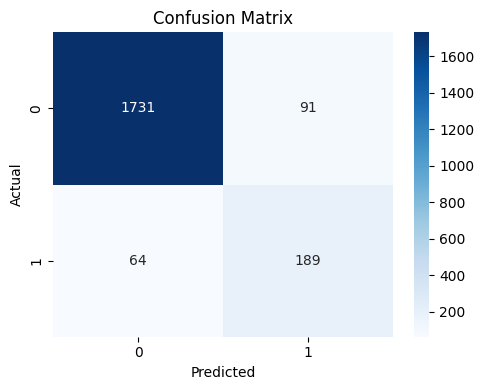

[I 2026-03-27 23:08:29,184] A new study created in memory with name: no-name-9149e70d-64a8-4bef-8934-bdf32c4d5df9



MODEL: catboost


[I 2026-03-27 23:09:12,306] Trial 0 finished with value: 0.7626236045272294 and parameters: {'iterations': 790, 'depth': 5, 'learning_rate': 0.01013428933337957, 'l2_leaf_reg': 9.50864129422951}. Best is trial 0 with value: 0.7626236045272294.
[I 2026-03-27 23:09:47,284] Trial 1 finished with value: 0.7545456363332309 and parameters: {'iterations': 522, 'depth': 6, 'learning_rate': 0.04722764696034223, 'l2_leaf_reg': 3.292346983898663}. Best is trial 0 with value: 0.7626236045272294.
[I 2026-03-27 23:11:52,180] Trial 2 finished with value: 0.7596846596162016 and parameters: {'iterations': 349, 'depth': 10, 'learning_rate': 0.05741187117339681, 'l2_leaf_reg': 9.039273423911691}. Best is trial 0 with value: 0.7626236045272294.
[I 2026-03-27 23:13:23,669] Trial 3 finished with value: 0.7453594849442233 and parameters: {'iterations': 793, 'depth': 8, 'learning_rate': 0.08745271039559689, 'l2_leaf_reg': 2.596840481183073}. Best is trial 0 with value: 0.7626236045272294.
[I 2026-03-27 23:14:


=== OPTUNA RESULTS ===
Best trial: 91
Best score (PR-AUC): 0.7709160777028787
Best params: {'iterations': 529, 'depth': 7, 'learning_rate': 0.014105805379974473, 'l2_leaf_reg': 6.23041488279881}

=== Best Threshold === 0.3367

=== Metrics ===
{'precision': 0.704119850187266, 'recall': 0.7430830039525692, 'f1': 0.7230769230769231, 'TP': 188.0, 'FP': 79.0, 'FN': 65.0, 'TN': 1743.0, 'pr_auc': 0.7709160777028787}

=== Global Confusion Matrix ===


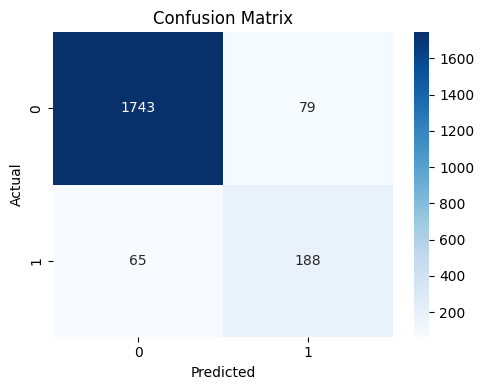

=== Model Benchmarking Results ===


,precision,recall,f1,TP,FP,FN,TN,pr_auc
catboost,0.704120,0.743083,0.723077,188.000000,79.000000,65.000000,1743.000000,0.770916
xgboost,0.715953,0.727273,0.721569,184.000000,73.000000,69.000000,1749.000000,0.759259
lightgbm,0.675000,0.747036,0.709193,189.000000,91.000000,64.000000,1731.000000,0.758094
random_forest,0.689139,0.727273,0.707692,184.000000,83.000000,69.000000,1739.000000,0.739449
logistic,0.486784,0.873518,0.625177,221.000000,233.000000,32.000000,1589.000000,0.703978
dummy,0.158233,0.778656,0.263017,197.000000,1048.000000,56.000000,774.000000,0.148498
mean_all,0.571538,0.766140,0.624954,193.833333,267.833333,59.166667,1554.166667,0.646699
mean_no_baseline,0.671150,0.742161,0.697297,187.766667,118.766667,65.233333,1703.233333,0.734884


In [18]:
results = run_benchmark_pipeline(df, verbose=True, plot_confusion=True)

results_df = pd.DataFrame(results).T
results_df = results_df.sort_values("pr_auc", ascending=False)

# =========================
# ADD SUMMARY ROWS
# =========================

# Mean over all models
results_df.loc["mean_all"] = results_df.mean()

# Mean without baselines
results_df.loc["mean_no_baseline"] = results_df.drop(
    index=["dummy", "logistic"], errors="ignore"
).mean()

print("=== Model Benchmarking Results ===")
results_df